# Environment set up

In this section we will set up a Colab environment for the MLEnd mini-project. Before starting, follow these simple instructions:

1.   Go to https://drive.google.com/
2.   Create a folder named 'Data' in 'MyDrive': On the left, click 'New' > 'Folder', enter the name 'Data', and click 'create'
3.   Open the 'Data' folder and create a folder named 'MLEndHW'.

Let's start by loading a few useful Python libraries and mounting our personal Google Drive storage system (i.e. making it available).

In [1]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Mounted at /content/drive


# Data download

In this section we will download a small subsample of the MLEnd Hums and Whistles Dataset.

You should be able to download the entire training dataset using a similar approach to the one used here for the subsample. As you will see, you only need to provide a different link.

Please note that even though we call it "training" dataset you can do whatever you want with it (for instance validate a set of models). We have kept a separate dataset for testing purposes, which we won't share with anyone.

First, let's define a function that will allow us to download a file into a chosen location.

In [2]:
def download_url(url, save_path):
    with urllib.request.urlopen(url) as dl_file:
        with open(save_path, 'wb') as out_file:
            out_file.write(dl_file.read())

The next step is to download the file 'MLEndHW_Sample.zip' into the folder 'MyDrive/Data/MLEndHW'. Note that this might take a while!

In [3]:
url  = "https://collect.qmul.ac.uk/down?t=4HUMAULLILD33PG7/4502734NBBCBOTSGIVPO6B0"
save_path = '/content/drive/MyDrive/Data/MLEndHW/MLEndHW_Sample.zip'
download_url(url, save_path)

Run the following cell to check that the MLEndHW folder contains the file 'MLEndHW_Sample.zip':

In [4]:
path = '/content/drive/MyDrive/Data/MLEndHW'
os.listdir(path)

['sample', 'MLEndHW_Sample.zip']

# Understanding our dataset sample

Let's unzip the sample data and check how many audio files we have.

In [7]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndHW/sample/'
zip_path = '/content/drive/MyDrive/Data/MLEndHW/MLEndHW_Sample.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

In [8]:
sample_path = '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/*.wav'
files = glob.glob(sample_path)
len(files)

98

This figure (98) corresponds to the number of **items** or **samples** in our dataset. Let's listen to some random audio files:

In [9]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

We can try to recognise each song and tell whether the interpreters are humming or whistling to the song.

Let's have a look at the name of the 98 audio file:

In [10]:
for file in files:
  print(file.split('/')[-1])

S3_whistle_1_Panther.wav
S2_whistle_2_Potter.wav
S1_hum_1_StarWars.wav
S4_hum_2_Frozen.wav
S2_hum_1_Showman.wav
S16_hum_1_Showman.wav
S6_whistle_1_Showman.wav
S16_whistle_2_Frozen.wav
S24_whistle_2_Frozen.wav
S32_hum_1_Rain.wav
S29_whistle_2_Showman.wav
S4_hum_2_Hakuna.wav
S2_whistle_2_Showman.wav
S2_hum_1_StarWars.wav
S16_whistle_2_Hakuna.wav
S2_hum_1_Rain.wav
S2_whistle_2_Frozen.wav
S16_whistle_2_Potter.wav
S1_whistle_1_Panther.wav
S34_whistle_2_Mamma.wav
S24_whistle_2_Potter.wav
S6_whistle_2_Potter.wav
S24_hum_1_Rain.wav
S16_whistle_1_Panther.wav
S15_whistle_2_Rain.wav
S24_whistle_1_Panther.wav
S32_whistle_2_Hakuna.wav
S24_hum_2_Potter.wav
S15_whistle_2_Showman.wav
S4_hum_4_Showman.wav
S1_hum_2_Hakuna.wav
S24_hum_2_Hakuna.wav
S1_hum_2_Potter.wav
S1_whistle_2_Mamma.wav
S1_hum_1_Rain.wav
S16_whistle_2_Rain.wav
S24_hum_2_Frozen.wav
S1_hum_1_Showman.wav
S29_hum_1_StarWars.wav
S24_hum_1_StarWars.wav
S34_hum_2_Hakuna.wav
S1_hum_2_Frozen.wav
S15_hum_2_Potter.wav
S32_whistle_2_Mamma.wav
S6_

As you can see, the name of each file follows the naming convention `[Participant ID]_[type of recording]_[interpretation number]_[song]`. We can parse each file name and extract this information. Let's do it for the first one:

In [11]:
print('The full path to the first audio file is: ', files[0])
print('\n')
print('The name of the first audio file is: ', files[0].split('/')[-1])
print('    The participand ID is: ', files[0].split('/')[-1].split('_')[0])
print('    The type of interpretation is: ', files[0].split('/')[-1].split('_')[1])
print('    The interpretation number is: ', files[0].split('/')[-1].split('_')[2])
print('    The song is: ', files[0].split('/')[-1].split('_')[3])

The full path to the first audio file is:  /content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S3_whistle_1_Panther.wav


The name of the first audio file is:  S3_whistle_1_Panther.wav
    The participand ID is:  S3
    The type of interpretation is:  whistle
    The interpretation number is:  1
    The song is:  Panther.wav


We can create a table-like structure using Python lists that collects the information that we can extract from the names of the audio files:

In [12]:
MLENDHW_table = []

for file in files:
  file_name = file.split('/')[-1]
  participant_ID = file.split('/')[-1].split('_')[0]
  interpretation_type = file.split('/')[-1].split('_')[1]
  interpretation_number = file.split('/')[-1].split('_')[2]
  song = file.split('/')[-1].split('_')[3].split('.')[0]
  MLENDHW_table.append([file_name,participant_ID,interpretation_type,interpretation_number, song])

MLENDHW_table

[['S3_whistle_1_Panther.wav', 'S3', 'whistle', '1', 'Panther'],
 ['S2_whistle_2_Potter.wav', 'S2', 'whistle', '2', 'Potter'],
 ['S1_hum_1_StarWars.wav', 'S1', 'hum', '1', 'StarWars'],
 ['S4_hum_2_Frozen.wav', 'S4', 'hum', '2', 'Frozen'],
 ['S2_hum_1_Showman.wav', 'S2', 'hum', '1', 'Showman'],
 ['S16_hum_1_Showman.wav', 'S16', 'hum', '1', 'Showman'],
 ['S6_whistle_1_Showman.wav', 'S6', 'whistle', '1', 'Showman'],
 ['S16_whistle_2_Frozen.wav', 'S16', 'whistle', '2', 'Frozen'],
 ['S24_whistle_2_Frozen.wav', 'S24', 'whistle', '2', 'Frozen'],
 ['S32_hum_1_Rain.wav', 'S32', 'hum', '1', 'Rain'],
 ['S29_whistle_2_Showman.wav', 'S29', 'whistle', '2', 'Showman'],
 ['S4_hum_2_Hakuna.wav', 'S4', 'hum', '2', 'Hakuna'],
 ['S2_whistle_2_Showman.wav', 'S2', 'whistle', '2', 'Showman'],
 ['S2_hum_1_StarWars.wav', 'S2', 'hum', '1', 'StarWars'],
 ['S16_whistle_2_Hakuna.wav', 'S16', 'whistle', '2', 'Hakuna'],
 ['S2_hum_1_Rain.wav', 'S2', 'hum', '1', 'Rain'],
 ['S2_whistle_2_Frozen.wav', 'S2', 'whistle', '2

We can load the table into a Pandas DataFrame and usie the additional functionalities of Pandas to explore the information extracted from the names of the audio files.

In [13]:
MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['file_id','participant','interpretation','number','song']).set_index('file_id')
MLENDHW_df

,participant,interpretation,number,song
file_id,,,,
S3_whistle_1_Panther.wav,S3,whistle,1,Panther
S2_whistle_2_Potter.wav,S2,whistle,2,Potter
S1_hum_1_StarWars.wav,S1,hum,1,StarWars
S4_hum_2_Frozen.wav,S4,hum,2,Frozen
S2_hum_1_Showman.wav,S2,hum,1,Showman
...,...,...,...,...
S16_hum_2_Mamma.wav,S16,hum,2,Mamma
S6_hum_2_Mamma.wav,S6,hum,2,Mamma
S32_hum_1_Showman.wav,S32,hum,1,Showman


# Feature extraction : Picth

Audio files are complex data types. Specifically they are **discrete signals** or **time series**, consisting of values on a 1D temporal grid. These values are known as *samples* themselves, which might be a bit confusing, as we have used this term to refer to the *items* in our dataset. The **sampling frequency** is the rate at which samples in an audio file are produced. For instance a sampling frequency of 5HZ indicates that 5 produce 5 samples per second, or 1 sample every 0.2 s.

Let's plot one of our audio signals:

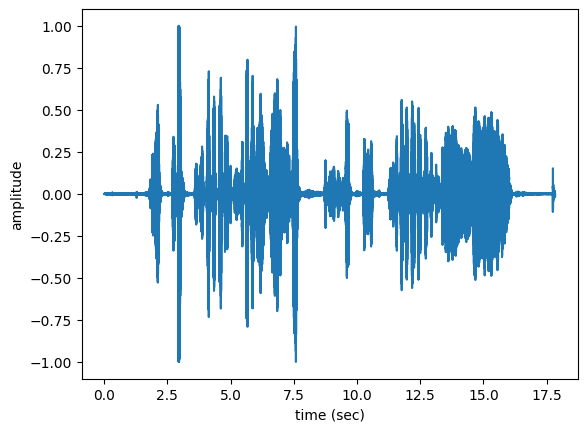

In [14]:
n=0
fs = None # Sampling frequency. If None, fs would be 22050
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

We can try to recognise the song and interpretation type. We can agree with the values shown in the ``` MLENDHW_df ``` dataframe by checking it:


In [15]:
MLENDHW_df.loc[files[n].split('/')[-1]]

,S3_whistle_1_Panther.wav
participant,S3
interpretation,whistle
number,1
song,Panther


Note that we are using the name of the audio file as the index in the Pandas DataFrame. In this example the actual name of the audio file happens to supply the same information, but in general this won't be the case. By changing the value of `n` in the previous cell, you can listen to other examples. If you are doing this during one of our lab sessions, please make sure that your mic is muted!

To find out exactly how complex is an audio signal, let's start by looking at the number of samples in one of our audio files:

In [16]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 786723 samples


If we are using a raw audio signal as the input of a machine learning model, we will be operating in a predictor space consisting of hundreds of thousands of dimensions. Compare this figure with the number of items (i.e. recordings) that we have. The question here is, if we have enough samples to train a model that takes one of these audio signals as an input.

One approach to deal with this huge dimensionality is to extract a few features from our signals and use these features as predictors instead. In this notebook we will use four audio features, namely:


1.   Power.
2.   Pitch mean.
3.   Pitch standard deviation.
4.   Fraction of voiced region.

In the next cell, we define a new function that gets the pitch of an audio signal (do not worry if you do not know what it is, but feel free to read about it!).

In [17]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

Let's consider the problem of identifying the type of interpretation of one of the audio recordings. Then next cell defines a function that takes a number of files and creates a NumPy array containing the 4 audio features used as predictors (`X`) and a binary label (`y`), that indicates whether the type of interpretation is a hum (`y=1`) or whistle (`y=0`).

In [18]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    #print(file_name)
    #print(labels_file.loc[fileID]['interpretation'])
    #print(labels_file.loc[fileID]['interpretation']=='hum')
    #yi = list(labels_file.loc[fileID]['interpretation'])[0]=='hum'
    yi = labels_file.loc[fileID]['interpretation']=='hum'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)

    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    xi = [power,pitch_mean,pitch_std,voiced_fr]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

Let's apply `getXy` to the subsample and obtain the NumPy predictor array (`X`) and a binary label (`y`). This could take a while, as we are processing each of the 98 recordings.

In [19]:
X,y = getXy(files, labels_file=MLENDHW_df, scale_audio=True, onlySingleDigit=True)

  0%|          | 0/98 [00:00<?, ?it/s]/tmp/ipython-input-17-398277011.py:6: UserWarning: With fmin=80.000, sr=44100 and frame_length=1024, less than two periods of fmin fit into the frame, which can cause inaccurate pitch detection. Consider increasing to fmin=86.133 or frame_length=1105.
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
  1%|          | 1/98 [00:05<08:09,  5.05s/it]/tmp/ipython-input-17-398277011.py:6: UserWarning: With fmin=80.000, sr=44100 and frame_length=1024, less than two periods of fmin fit into the frame, which can cause inaccurate pitch detection. Consider increasing to fmin=86.133 or frame_length=1105.
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
  9%|▉         | 9/98 [00:31<05:09,  3.48s/it]/tmp/ipython-input-17-398277011.py:6: UserWarning: With fmin=80.000, sr=48000 and frame_length=1024, less than two periods of fmin fit into the frame, which can cause inaccurate pitch detection. Consider increa

The next cell shows the shape of `X` and `y` and prints the labels vector `y`:

In [20]:
print('The shape of X is', X.shape)
print('The shape of y is', y.shape)
print('The labels vector is', y)

The shape of X is (98, 4)
The shape of y is (98,)
The labels vector is [False False  True  True  True  True False False False  True False  True
 False  True False  True False False False False False False  True False
 False False False  True False  True  True  True  True False  True False
  True  True  True  True  True  True  True False False False False  True
  True  True  True  True  True False False False  True  True False False
 False  True False  True False  True  True  True False  True  True  True
  True  True  True False  True False False False  True False False False
  True False False  True False False  True False False  True  True  True
 False False]


As you can see, we have 98 items consisting of 4 features (stored in `X`) and one binary label (stored in `y`). To check if our dataset is balanced, let's have a look:

In [21]:
print(' The number of hum recordings is ', np.count_nonzero(y))
print(' The number of whistle recordings is ', y.size - np.count_nonzero(y))

 The number of hum recordings is  49
 The number of whistle recordings is  49


# Modeling: Support Vector Machines

Let's build a support vector machine (SVM) model for the predictive task of identifying the type of interpretation (hum/whistle) of an audio signal, using the dataset that we have just created.

We will use the SVM method provided by scikit-learn and will split the dataset defined by X and y into a training set and a validation set.

In [22]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((68, 4), (30, 4), (68,), (30,))

We can identify the number of items in the training and validation sets.

Let's now fit an SVM model and print both the training accuracty and validation accuracy.


In [23]:
model  = svm.SVC(C=1)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.9558823529411765
Validation  Accuracy 0.9333333333333333
The support vectors are (26, 4)


We can compare the training and validation accuracies. We can deduct if our model overfitting, underfitting, performing well. The qeustion here is, what do we think the accuracy of a random classifier would be.

Let's normalise the predictors, to see if the performance improves.


In [24]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

model  = svm.SVC(C=1,gamma=2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 1.0
Validation  Accuracy 0.9666666666666667
The support vectors are (45, 4)


Feel free to try other machine learning models available in scikit.